---
## Install and import libraries as needed

In [ ]:
# install fuzzy c means
'''import sys
!{sys.executable} -m pip install scikit-fuzzy'''

# install plotly
'''import sys
!{sys.executable} -m pip install plotly'''

In [1]:
import skfuzzy as fuzz
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import seaborn as sns
import plotly.express as px
from numpy import searchsorted, array, real, where, shape, reshape, size
from numpy.fft import fft2, ifft2
from time import time
from bisect import bisect_right
import csv
from scipy.io import loadmat
from matplotlib.ticker import MaxNLocator
from matplotlib.colors import BoundaryNorm

%matplotlib inline

# bigger font
font = {'family' : 'helvetica','size'   : 18}
plt.rc('font', **font) 

---
## Double Gyre Data gen.

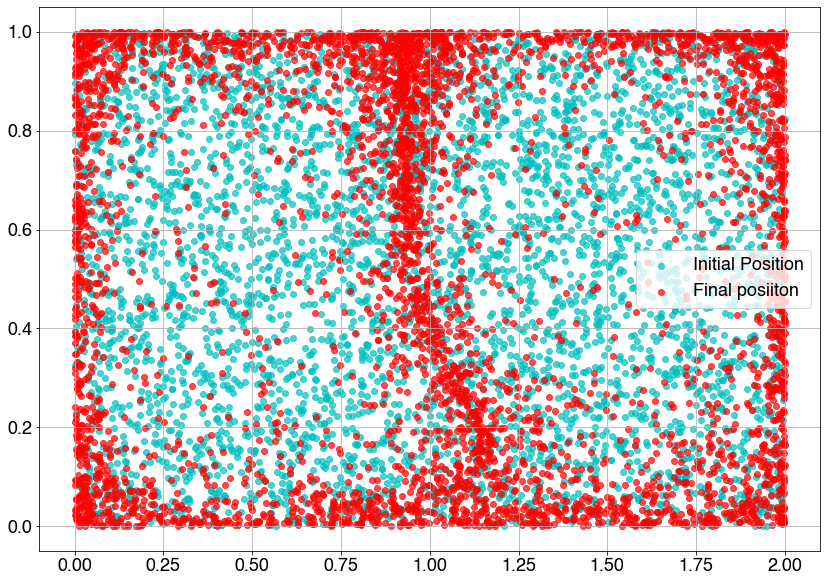

In [87]:
# constants
A = 0.25
epsilon = 0.25
w = np.pi*2 #/10

# horizontal comp.
def f(x,t):
    return epsilon*np.sin(w*t)*(x**2) + (1-2*epsilon*np.sin(w*t))*x

def u_gyre(x,y,t):
    return -np.pi*A*np.sin(np.pi*f(x,t))*np.cos(np.pi*y)

def v_gyre(x,y,t):
    return ((2*epsilon*np.sin(w*t)*x 
            + 1-2*epsilon*np.sin(w*t))*np.sin(np.pi*y)*np.pi*A*np.cos(np.pi*f(x,t)))

# function for random data init 

def rand_trace_double_gyre(M, final_t = 5, no_t_step = 50):

    # generate initial coords
    # draw in interval [0,1] to see it at work
    x0 = np.random.uniform(0,2,M)
    #x0 = (x0 - 0.5)*NX

    y0 = np.random.uniform(0,1,M)
    #y0 = (y0 - 0.5)*NY

    # time steps
    times, dt = np.linspace(0,final_t, no_t_step, retstep = True)

    # init arrays for point data
    x_pos = []
    y_pos = []

    # maybe add noise to this?

    # now reshape
    x = x0
    y = y0

    # save positions
    x_pos.append(x0)
    y_pos.append(y0)

    # loop through each time step
    for t in times:
        x1 = x + u_gyre(x,y,t)*dt
        y1 = y + v_gyre(x,y,t)*dt

        # make sure points wrap around the domain
        #x1 = wrap_domain(x1, -NX/2, NX, centred=True)

        # save positions
        x_pos.append(x1)
        y_pos.append(y1)

        y = np.copy(y1)
        x = np.copy(x1)
        
    return x_pos, y_pos

# number of data points 
# M = 8**2
M = 23**2
M = 66**2

x_pos, y_pos = rand_trace_double_gyre(M)
    
# plotting
plt.figure(figsize=(14,10))
plt.scatter(x_pos[0], y_pos[0], color='c', 
            label = 'Initial Position', 
            alpha = 0.7)
plt.scatter(x_pos[-1], y_pos[-1], color='r', 
            label = 'Final posiiton',
            alpha = 0.7)
plt.legend()
plt.grid()
plt.show()

---
## Loading simulation results

In [39]:
# loading and testing 
x_pos = np.load('./ShallowWater/eddie_results_store/eddie_files_result4/x_trajs.npy')
y_pos = np.load('./ShallowWater/eddie_results_store/eddie_files_result4/y_trajs.npy')
h_result = np.load('./ShallowWater/eddie_results_store/eddie_files_result4/h_fields.npy')
u_result = np.load('./ShallowWater/eddie_results_store/eddie_files_result4/u_fields.npy')
v_result = np.load('./ShallowWater/eddie_results_store/eddie_files_result4/v_fields.npy')

# omitting some results for speed
skip = 1

x_pos = np.copy(x_pos[::skip, :, :])
y_pos = np.copy(y_pos[::skip, :, :])

print(x_pos.shape)

(24000, 64, 64)


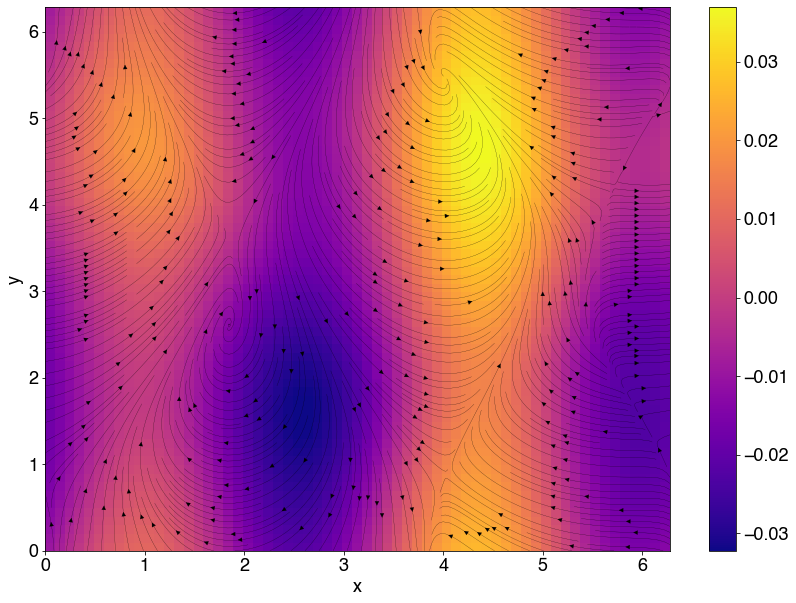

In [50]:
Nx = 64
Ny = 64

x_vec, dx = np.linspace(0, 2*np.pi, Nx, retstep=True)
y_vec, dy = np.linspace(0, 2*np.pi, Ny, retstep=True)

xx, yy = np.meshgrid(x_vec, y_vec)

iTime = -1

u = u_result[100]
v = v_result[100]
h = h_result[100]

u_S = np.concatenate((u_result[iTime, -1:Ny, :], u_result[iTime, 0:-1, :]), axis=0)
u_N = np.concatenate((u_result[iTime, 1:, :], u_result[iTime, 0:1, :]), axis=0)
v_W = np.concatenate((v_result[iTime, :, -1:Nx], v_result[iTime, :, 0:-1]), axis=1)
v_E = np.concatenate((v_result[iTime, :, 1:], v_result[iTime, :, 0:1]), axis=1)

zr = (v_E-v_W)/(2*dy)-(u_N-u_S)/(2*dy)

plt.figure(figsize=(14,10))
plt.pcolormesh(x_vec,y_vec, zr, cmap='plasma', alpha=1)
plt.colorbar()

plt.streamplot(x_vec, y_vec, u, v,
               color='black', linewidth = .2, density = 3)
plt.xlabel('x')
plt.ylabel('y')
plt.show()

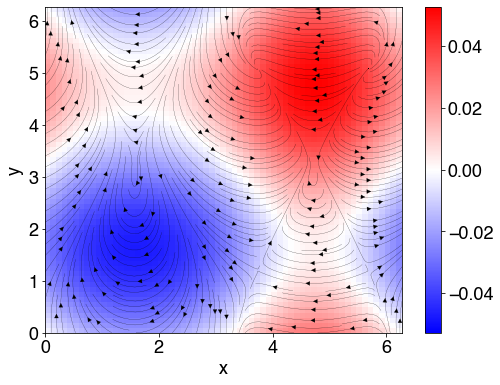

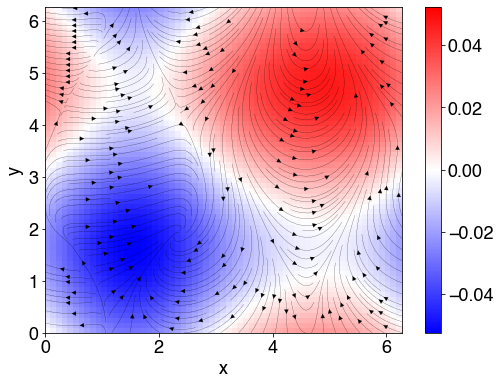

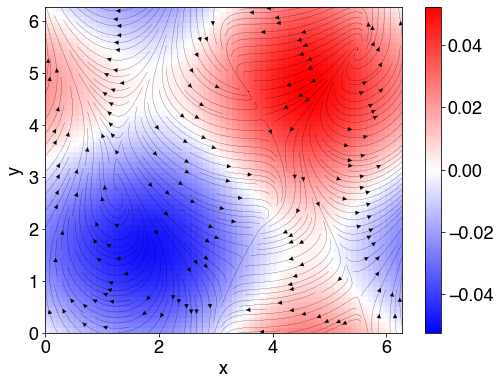

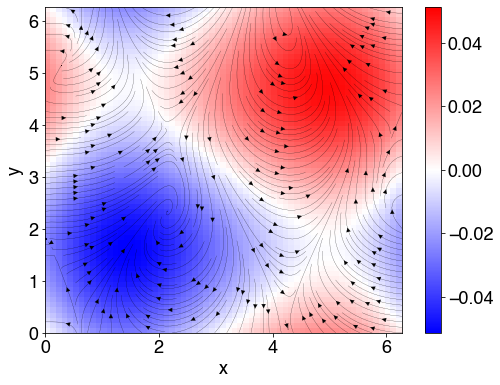

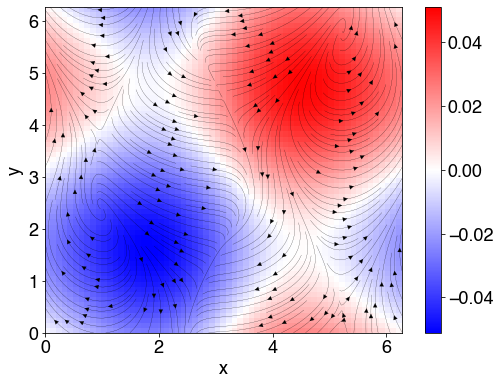

In [85]:
step = 0

step_list = [0, 3000, 6000, 9000, 12000]
# step_list = [0, 6000, 12000, 18000, 24000-1]
# step_list = [0, 4800, 4800*2, 4800*3, 4800*4, 24000-1]

for step in step_list:

    u = u_result[step]
    v = v_result[step]
    h = h_result[step]

    plt.figure(figsize=(8,6))

#     FTLE_field = FTLEcalc2d(x_pos[0], y_pos[0], x_pos[-1], y_pos[-1], 600)
    
#     plt.subplot(1,2,1)
#     plt.streamplot(x_vec, y_vec, u, v,
#                    color='black', linewidth = .2, density = 3)

#     plt.pcolormesh(x_vec, y_vec, FTLE_field)
#     plt.colorbar()
#     plt.xlabel('x')
#     plt.ylabel('y')
    
#     plt.subplot(1,2,2)
    plt.pcolormesh(x_vec, y_vec, -h, cmap='bwr')
    plt.colorbar()
    cval = np.max(abs(h))
    plt.clim((-cval, cval))
    
    plt.streamplot(x_vec, y_vec, u, v,
                   color='black', linewidth = .2, density = 2)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.show()
    
#     u_S = np.concatenate((u_result[iTime, -1:Ny, :], u_result[iTime, 0:-1, :]), axis=0)
#     u_N = np.concatenate((u_result[iTime, 1:, :], u_result[iTime, 0:1, :]), axis=0)
#     v_W = np.concatenate((v_result[iTime, :, -1:Nx], v_result[iTime, :, 0:-1]), axis=1)
#     v_E = np.concatenate((v_result[iTime, :, 1:], v_result[iTime, :, 0:1]), axis=1)

#     zr = (v_E-v_W)/(2*dy)-(u_N-u_S)/(2*dy)

#     plt.subplot(1,2,2)
#     plt.pcolormesh(x_vec,y_vec, zr, cmap='plasma', alpha=1)
#     plt.colorbar()


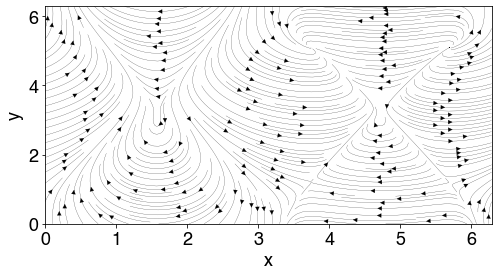

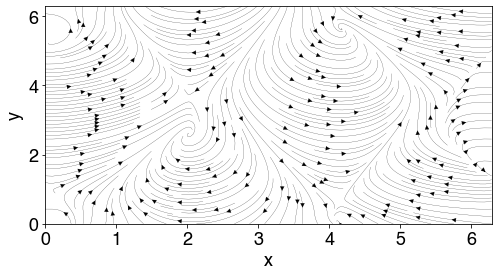

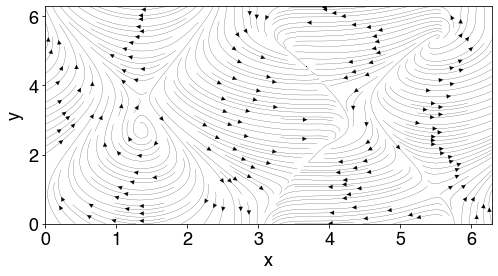

In [89]:
step = 0

step_list = [0, 2,8]

for step in step_list:

    u = u_result[step]
    v = v_result[step]
    h = h_result[step]

    plt.figure(figsize=(8,4))

    
    plt.streamplot(x_vec, y_vec, u, v,
                   color='black', linewidth = .2, density = 2)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.show()

# Loading turbulence results - no waves

(128, 128, 601)
(128, 128)
(128, 128, 601)
(128, 128)


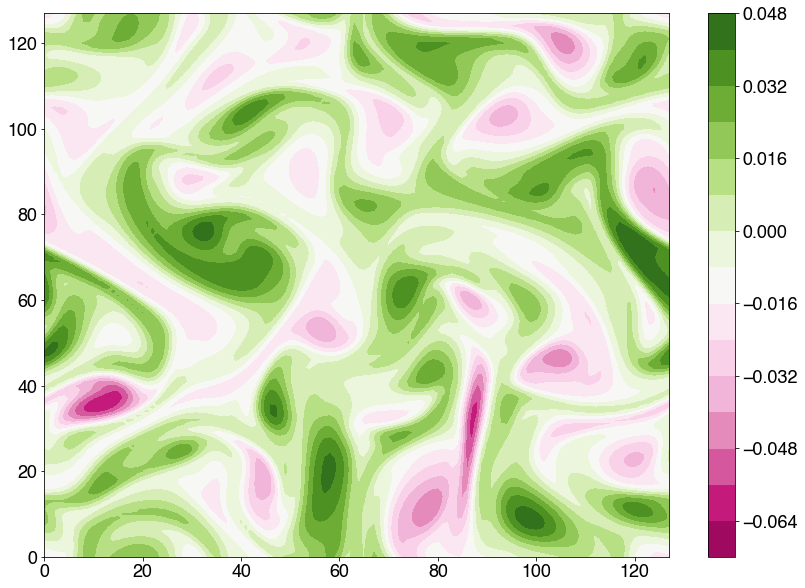

In [50]:
uvSW = loadmat('uv_SWturb_ki2_final_nowave.mat')
uvSW = loadmat('uv_SWturb_ki2_nowaves.mat')
uu = uvSW['u_all']
vv = uvSW['v_all']

print(uu.shape)

iTime = 240
# iTime = 550

# From matlab
# Tend = 345

Nx = 128
Ny = 128
dx = 2*np.pi/Nx
dy = 2*np.pi/Ny
# iTime = 600

u_S = np.concatenate((uu[-1:Ny, :, iTime], uu[0:-1, :, iTime]), axis=0)
u_N = np.concatenate((uu[1:, :, iTime], uu[0:1, :, iTime]), axis=0)
v_W = np.concatenate((vv[:, -1:Nx, iTime], vv[:, 0:-1, iTime]), axis=1)
v_E = np.concatenate((vv[:, 1:, iTime], vv[:, 0:1, iTime]), axis=1)

zr = (v_E-v_W)/(2*dy)-(u_N-u_S)/(2*dy)

print(np.shape(u_S))
print(np.shape(uu))
print(zr.shape)

cmap = plt.get_cmap('PiYG')
levels = MaxNLocator(nbins=15).tick_values(zr.min(), zr.max())
norm = BoundaryNorm(levels, ncolors=cmap.N, clip=True)

fig = plt.figure(figsize = (14,10))
ax = plt.axes()
# im = ax.pcolormesh(zr, cmap=cmap, norm=norm)
cf = ax.contourf(zr, levels=levels, cmap=cmap)
fig.colorbar(cf, ax=ax)

plt.show()

# Loading turbulence - waves

(128, 128)
(128, 128, 601)


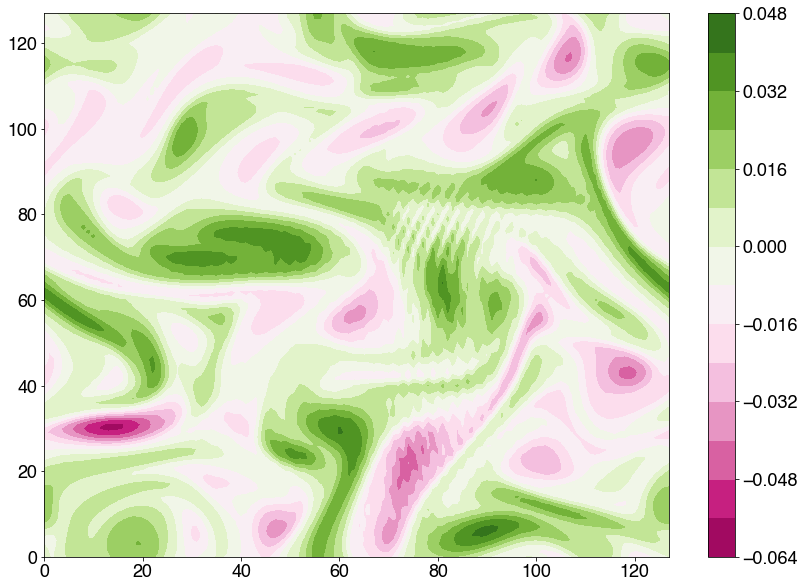

In [53]:
uvSW = loadmat('uv_SWturb_ki2_slowwaves_alt.mat')
uvSW = loadmat('uv_SWturb_ki2_slowwaves.mat')
uu = uvSW['u_all']
vv = uvSW['v_all']

# Time step
Tend = 240

# Note: kw = 4 (wave number)

Nx = 128
Ny = 128
dx = 2*np.pi/Nx
dy = 2*np.pi/Ny
# iTime = 600

iTime = uu.shape[-1] - 1

u_S = np.concatenate((uu[-1:Ny, :, iTime], uu[0:-1, :, iTime]), axis=0)
u_N = np.concatenate((uu[1:, :, iTime], uu[0:1, :, iTime]), axis=0)
v_W = np.concatenate((vv[:, -1:Nx, iTime], vv[:, 0:-1, iTime]), axis=1)
v_E = np.concatenate((vv[:, 1:, iTime], vv[:, 0:1, iTime]), axis=1)

zr = (v_E-v_W)/(2*dy)-(u_N-u_S)/(2*dy)

print(np.shape(u_S))
print(np.shape(uu))

cmap = plt.get_cmap('PiYG')
levels = MaxNLocator(nbins=15).tick_values(zr.min(), zr.max())
norm = BoundaryNorm(levels, ncolors=cmap.N, clip=True)

fig = plt.figure(figsize = (14,10))
ax = plt.axes()
# im = ax.pcolormesh(zr, cmap=cmap, norm=norm)
cf = ax.contourf(zr, levels=levels, cmap=cmap)
fig.colorbar(cf, ax=ax)

plt.show()

# Loading turbulence - fast waves

(128, 128)
(128, 128, 601)


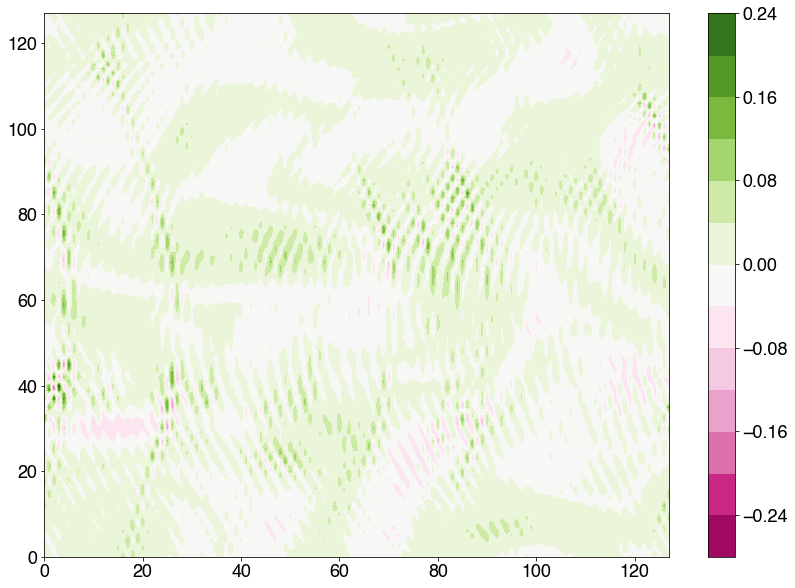

In [34]:
uvSW = loadmat('uv_SWturb_ki2_fastwaves_alt.mat')
uvSW = loadmat('uv_SWturb_ki2_fastwaves.mat')
uu = uvSW['u_all']
vv = uvSW['v_all']

# Time step
Tend = 240

# Note: kw = 7 (wave number)

Nx = 128
Ny = 128
dx = 2*np.pi/Nx
dy = 2*np.pi/Ny
# iTime = 600

iTime = uu.shape[-1] - 1

u_S = np.concatenate((uu[-1:Ny, :, iTime], uu[0:-1, :, iTime]), axis=0)
u_N = np.concatenate((uu[1:, :, iTime], uu[0:1, :, iTime]), axis=0)
v_W = np.concatenate((vv[:, -1:Nx, iTime], vv[:, 0:-1, iTime]), axis=1)
v_E = np.concatenate((vv[:, 1:, iTime], vv[:, 0:1, iTime]), axis=1)

zr = (v_E-v_W)/(2*dy)-(u_N-u_S)/(2*dy)

print(np.shape(u_S))
print(np.shape(uu))

cmap = plt.get_cmap('PiYG')
levels = MaxNLocator(nbins=15).tick_values(zr.min(), zr.max())
norm = BoundaryNorm(levels, ncolors=cmap.N, clip=True)

fig = plt.figure(figsize = (14,10))
ax = plt.axes()
# im = ax.pcolormesh(zr, cmap=cmap, norm=norm)
cf = ax.contourf(zr, levels=levels, cmap=cmap)
fig.colorbar(cf, ax=ax)

plt.show()

## Advecting Particles from velocity field

In [4]:
def bilinear_interp_periodic(x_1d, y_1d, zz, x_wanted, y_wanted):
    '''
    Hossein's interpolation function:
    x_1d, y_1d (1darray): row and columns respectively of regularly spaced grid - each is a 1d array
    zz (2d array): values to be interpolated
    x_wanted, y_wanted: array of particle positions we want to interpolate
    '''
    init_shape = shape(x_wanted)
    x_wanted = x_wanted.flatten()
    y_wanted = y_wanted.flatten()
    z_wanted = np.zeros_like(x_wanted)

#     x_max = np.max(x_1d)
#     x_min = np.min(x_1d)
#     y_max = np.max(y_1d)
#     y_min = np.min(y_1d)

#     x_interval = x_max - x_min
#     y_interval = y_max - y_min

    for i_xy in range(0, size(x_wanted)):
        x = x_wanted[i_xy]
        y = y_wanted[i_xy]

        # this might be redundant and actually causing errors in the general case?
        # x = x - np.floor(x/x_interval)*(x_interval)
        # y = y - np.floor(y/(y_interval))*(y_interval)

#         i_2x = searchsorted(x_1d, x)
#         i_2y = searchsorted(y_1d, y)

        i_2x = bisect_right(x_1d, x)
        i_2y = bisect_right(y_1d, y)
        i_1x = i_2x - 1
        i_1y = i_2y - 1
        
        #print(i_2x, i_2y)

        FF = array([[zz[i_1y, i_1x], zz[i_2y, i_1x]],
                       [zz[i_1y, i_2x], zz[i_2y, i_2x]]])
        z_wanted[i_xy] = 1/((x_1d[i_2x]-x_1d[i_1x])*(y_1d[i_2y]-y_1d[i_1y]))*(
            array([x_1d[i_2x] - x, x - x_1d[i_1x]])@FF@
            array([[y_1d[i_2y] - y], [y - y_1d[i_1y]]]))

    return reshape(z_wanted, init_shape)

def domain_check2(x,y, x_grid, y_grid):
    '''
    Function to get particle position in 'original' domain
    faster and assumes that we do not get more than 1 domain length away from the domain in 1 timestep
    '''

    # get max and min values
    x_max = x_grid[-1]
    x_min = x_grid[0]
    y_max = y_grid[-1]
    y_min = y_grid[0]

    # intervals
    x_int = x_max - x_min
    y_int = y_max - y_min

    # get x coords in original domain
    new_x = where(x >= x_max, x - x_int, x)
    new_x = where(new_x < x_min, new_x + x_int, new_x)

    # get y coords in original domain
    new_y = where(y >= y_max, y - y_int, y)
    new_y = where(new_y < y_min, new_y + y_int, new_y)

    return new_x, new_y

In [54]:
Nx = 128
Ny = 128

# define domain boundaries
x_start = 0
x_end = 2*np.pi
y_start = 0
y_end = 2*np.pi

res = 5
no_skip = 2

# timestep
dt = 0.04 * (res*no_skip)
dt = 0.2

# create x and y spacing
x = np.linspace(0, 2*np.pi, Nx)
y = np.linspace(0, 2*np.pi, Ny)


# create particle grid
x_grid, y_grid = np.meshgrid(x, y)

# copy grid position for initial position
x_pos, y_pos = np.copy(x_grid), np.copy(y_grid)

# add trajectory to list and start list
x_traj = [np.copy(x_pos)]
y_traj = [np.copy(y_pos)]

# loop through each velocity field
for i in range(uu.shape[-1]):
    
    # check all points are in domain
    x_in_domain, y_in_domain = domain_check2(x_pos, y_pos, x, y)
    
    # run twice for redundancy
    x_pos_in_domain_check, y_pos_in_domain_check = domain_check2(x_in_domain, y_in_domain, x, y)
    
    # check that particles are in domain
    while np.all(x_pos_in_domain_check == x_in_domain) != True or np.all(y_pos_in_domain_check == y_in_domain) != True:
        x_pos_in_domain_check, y_pos_in_domain_check = np.copy(x_in_domain), np.copy(y_in_domain)
        x_in_domain, y_in_domain = domain_check2(x_pos_in_domain_check, x_pos_in_domain_check, x, y)
    
    # interpolate velocity values and update x_pos, y_pos
    x_pos += dt*bilinear_interp_periodic(x, y, uu[:,:,i], x_in_domain, y_in_domain)
    y_pos += dt*bilinear_interp_periodic(x, y, vv[:,:,i], x_in_domain, y_in_domain)
    
#     if i % 100 == 0:
#         plt.figure(figsize=(14,10))
#         plt.scatter(x_pos.flatten(), y_pos.flatten(),
#                     alpha = 0.75)
#         plt.grid()
#         plt.show()
    
    x_traj.append(np.copy(x_pos))
    y_traj.append(np.copy(y_pos))
    

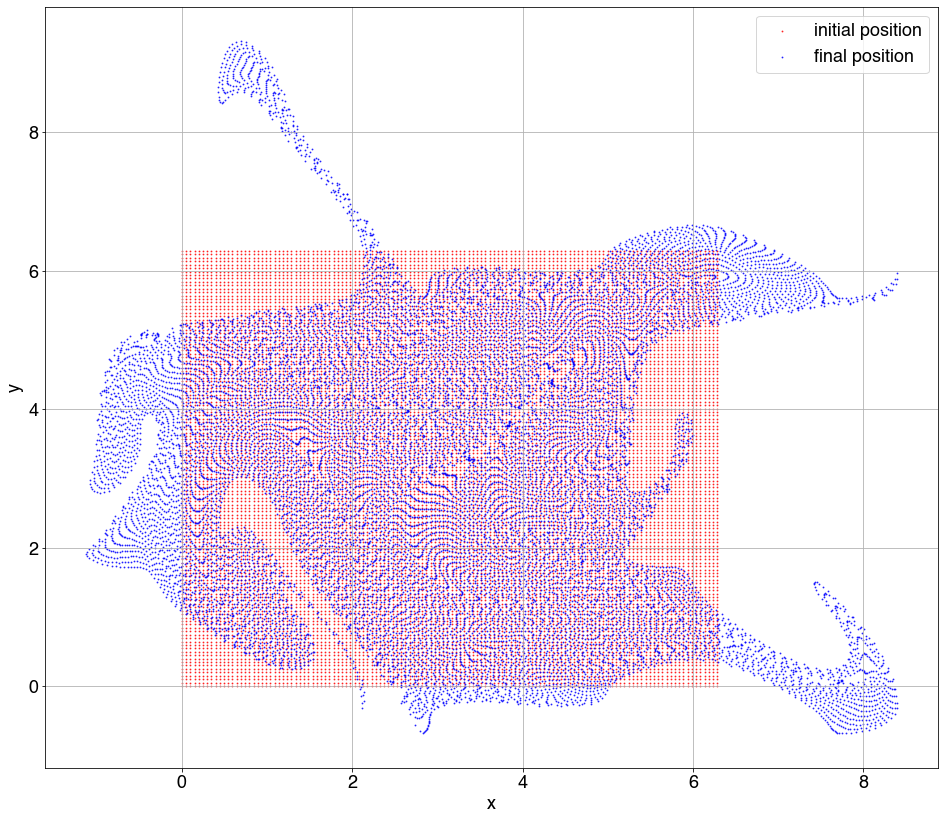

In [39]:
point_size=.8

plt.figure(figsize=(16,14))

plt.scatter(x_traj[0].flatten(), y_traj[0].flatten(), 
            c='r', alpha=0.75, label = 'initial position', s = point_size)
plt.scatter(x_traj[-1].flatten(), y_traj[-1].flatten(), 
            c='b', alpha=0.75, label = 'final position', s = point_size)


plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.grid()
plt.show()

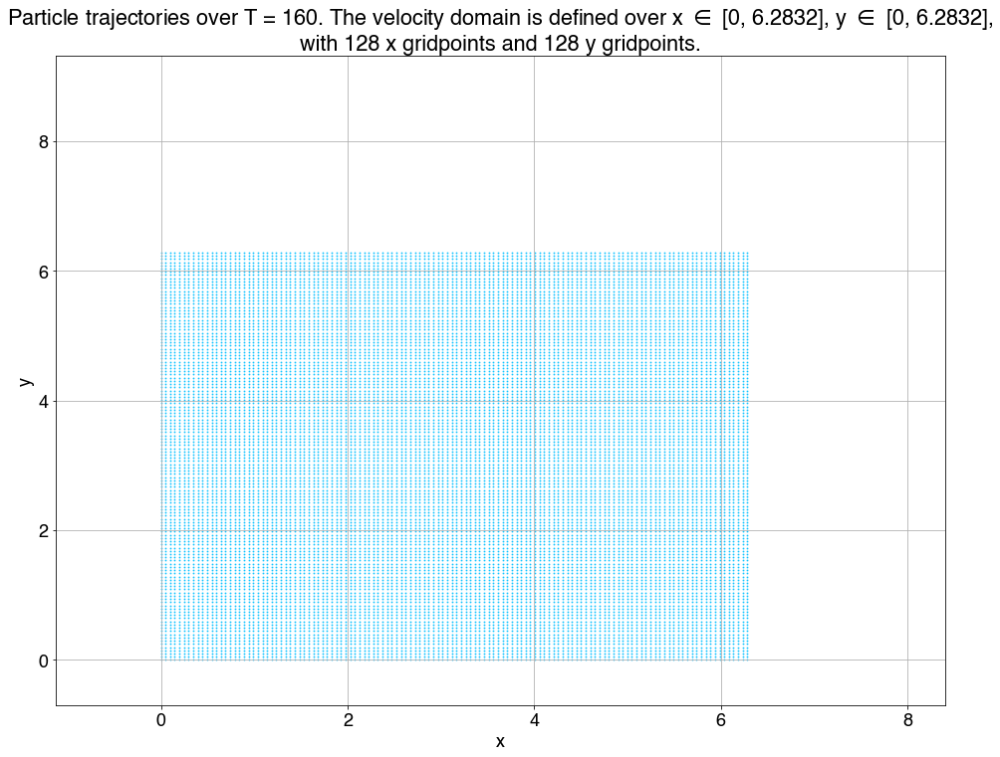

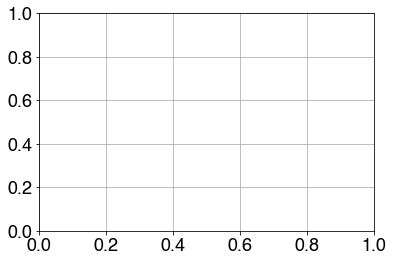

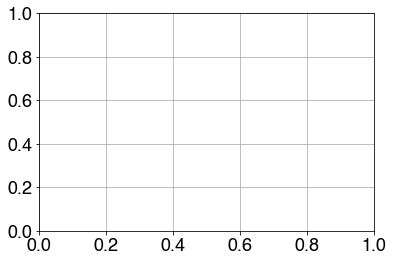

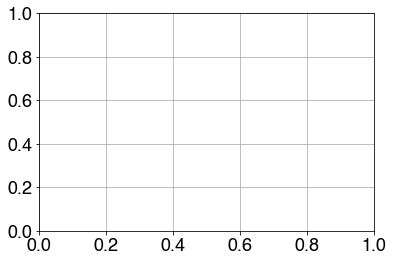

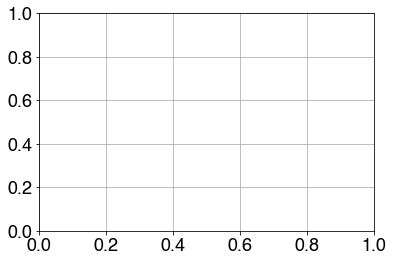

...

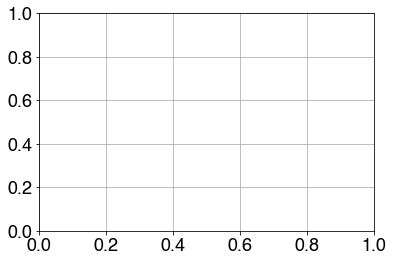

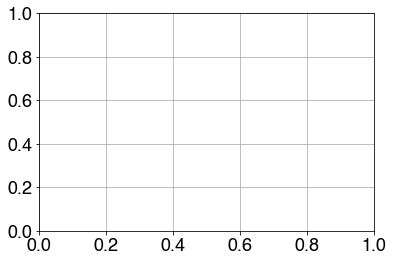

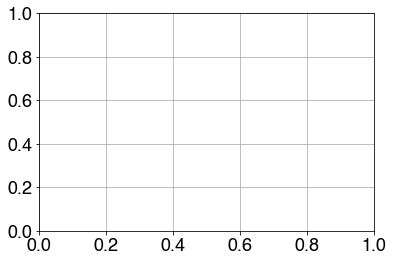

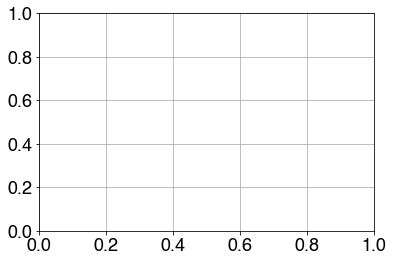

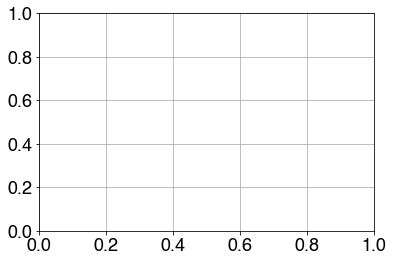

In [41]:
from celluloid import Camera

# taken from MATLAB

# # for standing vortex
# x_traj, y_traj = x_pos, y_pos

Tend = 160
x_start = 0
x_end = 2*np.pi
y_start = 0
y_end = 2*np.pi
Nx = 128
Ny = 128

# # init array
# colour_label = np.zeros_like(plot)

# # set values based on vorticity of fluid
# colour_label = np.where(plot > 1.002, 1, 0) # 1.002
# ind_2 = np.where(plot<0.998) # 0.998
# colour_label[ind_2] = 2

# create figure object
fig = plt.figure(figsize=(16,12))
# load axis box
ax = plt.axes()
# set axis limit
ax.set_ylim(np.min(y_traj), np.max(y_traj))
ax.set_xlim(np.min(x_traj), np.max(x_traj))
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_title(f'Particle trajectories over T = {Tend}. ' #' with timestep {dt}.\n'
             + f'The velocity domain is defined over x $\in$ [{np.round(x_start, 4)}, {np.round(x_end, 4)}], '
             + f'y $\in$ [{np.round(y_start, 4)}, {np.round(y_end, 4)}],\n'
             + f'with {Nx} x gridpoints and {Ny} y gridpoints.')

# getting colour for each individual particle
if len(x_pos) > 1:
    # colour array
    no_colour = x_traj[0].flatten().shape[0]
    colour = np.arange(no_colour)
else:
    colour = [0]

# generating gif
camera = Camera(fig)
for i in range(0, len(x_traj), 1):
    ax.scatter(x_traj[i], y_traj[i], cmap='coolwarm', alpha=0.85, c='deepskyblue', s=point_size) #color = ['r', 'm', 'b', 'c', 'k'])
    plt.grid()
    plt.pause(0.001)
    camera.snap()

# saving gif
animation = camera.animate()
animation.save('tb_final_nowave.gif', writer='pillow', fps=30)

---
## FTLE Structure

In [52]:
# FTLE Calculator

def FTLEcalc2d(xx0, yy0, xx1, yy1, dt):
    '''
    dt = time change
    
    This function takes meshgrids of particle positions at 2 different times
    and computes the Fixed Time Lyapunov Exponent (FTLE) grid associated with the original X0 grid.
    
    Note, 
    x0.shape == x1.shape
    same for y
    '''
    
    # grid dimensions and steps
    '''# Note Haller uses 2*dx for computation of deformation gradient so can save FLOPS by using dx = 2*dx
    dx = abs(xx0[1] - xx0[0])
    dy = abs(yy0[1] - yy0[0])'''
    
    # for non-uniform spacing?
    x_grid = xx0[0,:]
    y_grid = yy0[:,0]
            
    # calculate gradients
    fy1, fx1 = np.gradient(xx1, y_grid, x_grid)
    fy2, fx2 = np.gradient(yy1, y_grid, x_grid)
    
    # compute components of Cauchy-Green Strain tensor
    cg11 = fy1**2 + fx1**2
    cg12 = fy1*fy2 + fx1*fx2
    cg21 = fx1*fx2 + fy1*fy2
    cg22 = fy2**2 + fx2**2
    
    # trace and determinant
    tr = cg11 + cg22
    det = cg11*cg22 - cg12*cg21
    
    # largest eigenvalue
    max_eig = tr/2 + np.sqrt(tr**2 - 4*det)/2
    
    # compute FTLE matrix
    FTLE = np.log(max_eig)/(2*dt)
    
    return FTLE

In [6]:
skip = 1
skip=1

x_pos, y_pos = np.array(x_traj[::skip]), np.array(y_traj[::skip])

In [69]:
x_pos.shape

(802, 64, 64)

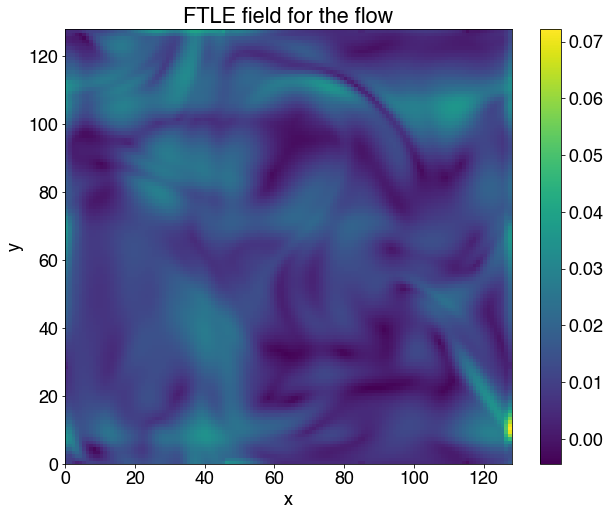

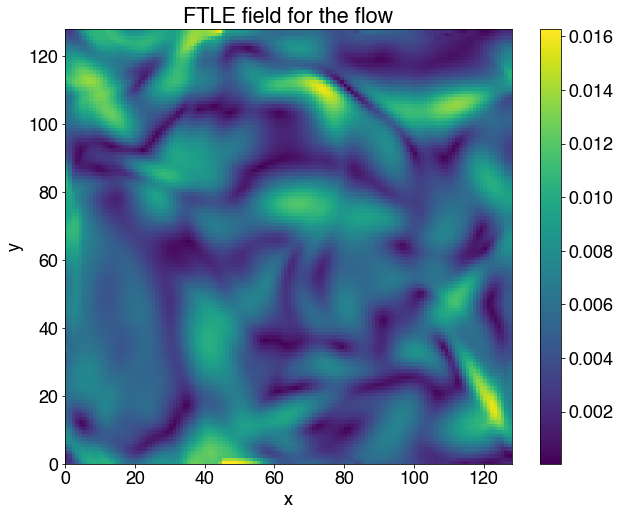

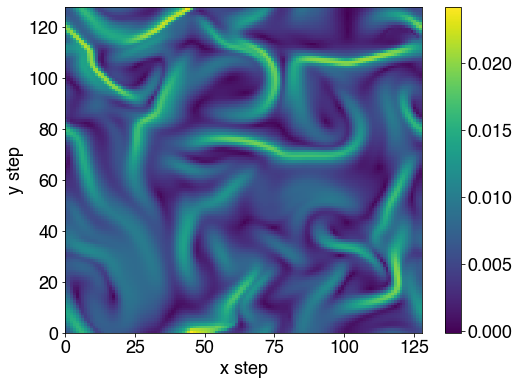

In [46]:
#gap = 100

# test FTLE 
FTLE_field = FTLEcalc2d(x_pos[1], y_pos[1], x_pos[2], y_pos[2], dt)

plt.figure(figsize = (10,8))
plt.pcolor(FTLE_field)
plt.colorbar()
plt.xlabel('x')
plt.ylabel('y')
plt.title('FTLE field for the flow')
plt.show()

# test FTLE 
FTLE_field = FTLEcalc2d(x_pos[0], y_pos[0], x_pos[-1], y_pos[-1], 160)

plt.figure(figsize = (8,6))
plt.pcolor(FTLE_field)
plt.colorbar()
plt.xlabel('x step')
plt.ylabel('y step')
#plt.title('FTLE field for the flow')
plt.show()

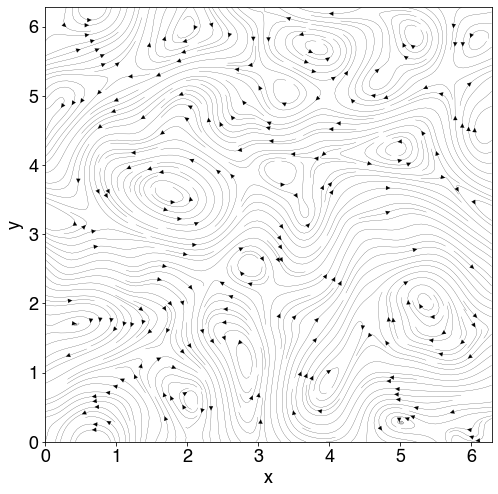

In [51]:
step = 0

step_list = [300]
# step_list = [0, 6000, 12000, 18000, 24000-1]
# step_list = [0, 4800, 4800*2, 4800*3, 4800*4, 24000-1]

x_vec = np.linspace(0,2*np.pi,Nx)
y_vec = np.linspace(0,2*np.pi,Ny)
xx, yy = np.meshgrid(x_vec,y_vec)

for step in step_list:

    u = uu[:,:,step]
    v = vv[:,:,step]
#     h = h_result[step]

    u_S = np.concatenate((uu[-1:Ny, :, iTime], uu[0:-1, :, iTime]), axis=0)
    u_N = np.concatenate((uu[1:, :, iTime], uu[0:1, :, iTime]), axis=0)
    v_W = np.concatenate((vv[:, -1:Nx, iTime], vv[:, 0:-1, iTime]), axis=1)
    v_E = np.concatenate((vv[:, 1:, iTime], vv[:, 0:1, iTime]), axis=1)

    zr = (v_E-v_W)/(2*dy)-(u_N-u_S)/(2*dy)
    
    max_z = np.max(abs(zr))

    plt.figure(figsize=(8,8))

    plt.streamplot(x_vec, y_vec, u, v,
                   color='black', linewidth = .2, density = 3)
#     plt.pcolormesh(x_vec, y_vec, zr, cmap='bwr', alpha=0.95)
#     plt.colorbar()
#     plt.clim((-0.0425, 0.0425))
    plt.xlabel('x')
    plt.ylabel('y')
    plt.show()


In [30]:
def entropy_calc(x):
    '''
    function to calculate entropy of a results set
    '''
    n = len(x)
    y = x*np.log(x)
    return -(np.sum(y)) / n

In [11]:
# # plotting different liklihood values
# def plot_cluster_likelihoods(x, y, u, fig_dim = (12,12)):
    
#     #fig, axes = plt.subplots(u.shape[0], 1, sharex=True, figsize=(16,10))
    
#     print(f'\nThe likelihood plots for {u.shape[1]} clusters are as follows: \n')
    
#     # create bins
#     bins = np.linspace(0,1,11)
    
#     # loop through each cluster
#     for i in range(u.shape[1]):
        
#         # extract cluster likelihood
#         cluster_u = u[:,i]
        
#         # bin u values
#         u_binned = np.digitize(cluster_u, bins)

#         # plotting
#         plt.figure(figsize=fig_dim)

#         sns.scatterplot(x=x_dat,
#                         y=y_dat,
#                         hue=u_binned,
#                         palette='plasma',
#                         alpha=0.7,
#                         legend='full')

#         plt.title(f'Cluster {i+1} membership likelihood values')
#         plt.legend(np.round(bins[1:],1), title='Likelihood Value')
#         plt.xlabel('x')
#         plt.ylabel('y')
#         plt.grid()
#         plt.tight_layout()
#     plt.show()
    
#     print('-------------------------------------------------------------------------------------------------\n')
    
def entropy_calc(x):
    '''
    function to calculate entropy of a results set
    '''
    n = len(x)
    y = x*np.log(x)
    return -(np.sum(y)) / n

# plotting different liklihood values
def plot_cluster_likelihoods(x, y, u, fig_dim = (12,12)):
    
    #fig, axes = plt.subplots(u.shape[0], 1, sharex=True, figsize=(16,10))
    
    print(f'\nThe likelihood plots for {u.shape[1]} clusters are as follows: \n')
    
    # create bins
    bins = np.linspace(0,1,11)
    
    # loop through each cluster
    for i in range(u.shape[1]):
        
        # extract cluster likelihood
        cluster_u = u[:,i]
        
        # bin u values
        u_binned = np.digitize(cluster_u, bins)

        # plotting
        plt.figure(figsize=fig_dim)

        sns.scatterplot(x=x_dat,
                        y=y_dat,
                        hue=u_binned,
                        palette='plasma',
                        alpha=0.7,
                        legend='full')

        plt.title(f'Cluster {i+1} membership likelihood values')
        plt.legend(np.round(bins[1:],1), title='Likelihood Value')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.grid()
        plt.tight_layout()
    plt.show()
    
    print('-------------------------------------------------------------------------------------------------\n')
    
# plotting different liklihood values
def plot_cluster_likelihoods_alt(x, y, u, fig_dim = (14,6), tile_config='auto', point_size = 50):
    
    #fig, axes = plt.subplots(u.shape[0], 1, sharex=True, figsize=(16,10))
    
    print(f'\nThe likelihood plots for {u.shape[1]} clusters are as follows: \n')
    
    x0 = np.linspace(0, 2*np.pi, Nx)
    y0 = np.linspace(0, 2*np.pi, Ny)
    
    if tile_config == 'auto':
        tile = int(np.ceil(np.sqrt(u.shape[1])))
        tile_config = (tile, tile)
    
    idx = 1
    
    # create bins
    bins = np.linspace(0,1,11)
    
    plt.figure(figsize=fig_dim)
    
    # loop through each cluster
    for i in range(u.shape[1]):
        
        # extract cluster likelihood
        cluster_u = u[:,i]
        
        u2d = np.reshape(cluster_u, (Nx,Ny))

        # plotting
        
        plt.subplot(tile_config[0], tile_config[1], idx)
        plt.pcolormesh(x0,y0,u2d, cmap='plasma')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.colorbar()
        # plt.clim((0,1))
        
        idx += 1
    
    plt.tight_layout()
    plt.show()
    
    print('-------------------------------------------------------------------------------------------------\n')
    
# plotting different liklihood values
def plot_cluster_likelihoods_super(x, y, u, fig_dim = (14,6), tile_config='auto', point_size = 50):
    
    #fig, axes = plt.subplots(u.shape[0], 1, sharex=True, figsize=(16,10))
    
    print(f'\nThe likelihood plots for {u.shape[1]} clusters are as follows: \n')
    
    x0 = np.linspace(0, 2*np.pi, Nx)
    y0 = np.linspace(0, 2*np.pi, Ny)
    
    if tile_config == 'auto':
        tile = int(np.ceil(np.sqrt(u.shape[1])))
        tile_config = (tile, tile)
    
    idx = 1
    
    # create bins
    bins = np.linspace(0,1,11)
    
    plt.figure(figsize=fig_dim)
    
    # loop through each cluster
    for i in range(u.shape[1]):
        
        # extract cluster likelihood
        cluster_u = u[:,i]
        
        u2d = np.reshape(cluster_u, (Nx,Ny))

        # plotting
        
#         plt.subplot(tile_config[0], tile_config[1], idx)
        plt.pcolormesh(x0,y0,u2d, cmap='plasma')
        plt.xlabel('x')
        plt.ylabel('y')
        # plt.clim((0,1))
        
        idx += 1
    
#     plt.tight_layout()
    plt.colorbar()
    plt.show()
    
    
    print('-------------------------------------------------------------------------------------------------\n')

---
## Trajectory matrix

In [21]:
# forming trajectory matrix

# total number of positions in each trajectory
total_ent = x_pos[0].flatten().shape[0]

# initialise array to hold all x coordinates
x_traj_mat = np.array([])

# init holder matrix
hold = np.zeros(len(x_pos))

# loop through each position in the trajectory
for j in range(total_ent):
    
    # loop through each step of trajectory
    for i in range(x_pos.shape[0]):
        # put x positions in holder array
        hold[i] = (x_pos[i].flatten())[j]
        
    if np.any(x_traj_mat) == False:
        x_traj_mat = np.copy(hold)
    else:
        x_traj_mat = np.vstack((x_traj_mat,hold))
    
y_traj_mat = np.array([])

# loop through each position in the trajectory
for j in range(total_ent):

    # loop through each step of trajectory
    for i in range(y_pos.shape[0]):
        hold[i] = (y_pos[i].flatten())[j]
        
    if np.any(y_traj_mat) == False:
        y_traj_mat = np.copy(hold)
    else:
        y_traj_mat = np.vstack((y_traj_mat,hold))
        
### now in form x_{i,t}, ..., x_{i,T}, ..., y_{i,1}, ..., y_{i,T}

# initialise trajectory matrix
traj_mat = np.zeros((x_traj_mat.shape[0], x_traj_mat.shape[1]*2))

# loop through each trajectory
for i in range(x_traj_mat.shape[0]):
    # loop through each position in the trajectory
    for j in range(0, x_traj_mat.shape[1]):
        # store x position
        traj_mat[i,j] = x_traj_mat[i,j]
        # store y position
        traj_mat[i,j+x_traj_mat.shape[1]] = y_traj_mat[i,j]

In [7]:
# total number of positions in each trajectory
total_ent = x_pos[0].flatten().shape[0]

# no timesteps
no_tsteps = len(x_pos)

# initialise array to hold all x coordinates
x_traj_mat = np.array([])

x_traj_mat = 1000*np.ones(no_tsteps)

# init holder matrix
hold = np.zeros(len(x_pos))

start = time()

# loop through each position in the trajectory
for j in range(total_ent):

    # loop through each step of trajectory
    for i in range(no_tsteps):
        # put x positions in holder array
        hold[i] = (x_pos[i].flatten())[j]

    x_traj_mat = np.vstack((x_traj_mat,hold))

x_traj_mat = x_traj_mat[1:,:]

end = time()

print(f'The time for x coords is {end-start}')

y_traj_mat = 1000*np.ones(no_tsteps)

# loop through each position in the trajectory
for j in range(total_ent):

    # loop through each step of trajectory
    for i in range(no_tsteps):
        hold[i] = (y_pos[i].flatten())[j]

    y_traj_mat = np.vstack((y_traj_mat,hold))

y_traj_mat = y_traj_mat[1:,:]
    
    # initialise trajectory matrix
traj_mat = np.zeros((x_traj_mat.shape[0], x_traj_mat.shape[1]*2))

# loop through each trajectory
for i in range(x_traj_mat.shape[0]):
    # loop through each position in the trajectory
    for j in range(0, x_traj_mat.shape[1]):
        # store x position
        traj_mat[i,j] = x_traj_mat[i,j]
        # store y position
        traj_mat[i,j+x_traj_mat.shape[1]] = y_traj_mat[i,j]

The time for x coords is 625.7758238315582


---
## Fuzzy C-means clustering


The likelihood plots for 16 clusters are as follows: 



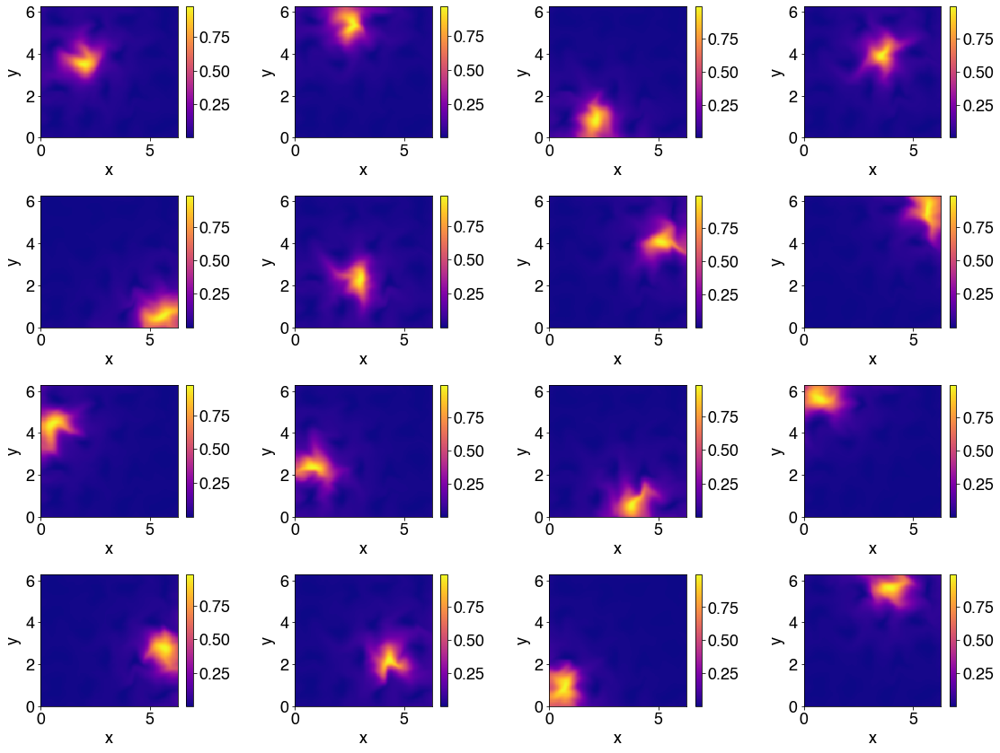

-------------------------------------------------------------------------------------------------

The best cluster number based on FCP is 16


{16: 0.3777359425518998}

In [13]:
# number of clusters
no_clusters_list = [20,16,13,12,11,10,9,8,7,6,5,4,3,2]

no_clusters_list = [16]

#no_clusters_list = [20, 16, 4]


fpc_dict = {}
pe_dict = {}

# final x and y positions - easier visualisation
x_dat = x_pos[0].flatten()
y_dat = y_pos[0].flatten()

# loop through number of clusters
for no_clusters in no_clusters_list:
    
    # fuzzy c-means
    fuzzy_result = fuzz.cluster.cmeans(traj_mat.T,
                              no_clusters,
                              m=2,
                              error=10**(-3),
                              maxiter= 10**3)
 
    u = fuzzy_result[1].T
    
    plot_cluster_likelihoods_alt(x_dat, y_dat, u, (16,12))

    
    entropy = np.apply_along_axis(entropy_calc, 0, u)
    
    fpc_dict[no_clusters] = fuzzy_result[-1]
    
    pe_dict[no_clusters] = np.sum(entropy)
    
# max dict value
max_value = max(fpc_dict.values())

for key in fpc_dict.keys():
    if fpc_dict[key] == max_value:
        max_key = key
        break
        
print(f'The best cluster number based on FCP is {max_key}')

fpc_dict


The likelihood plots for 25 clusters are as follows: 



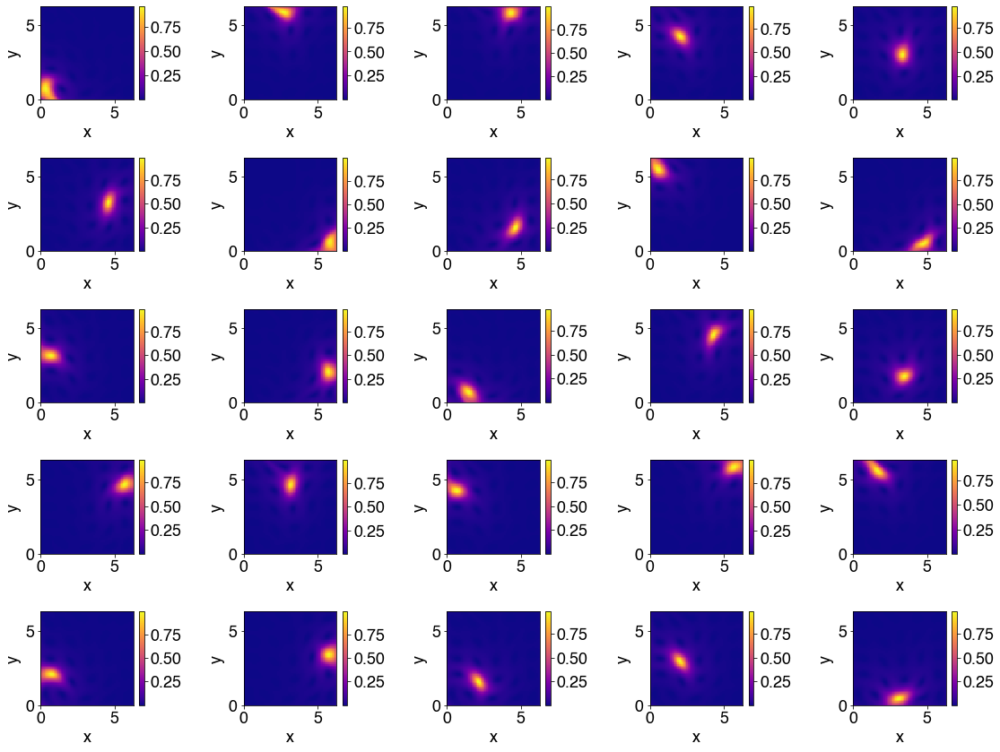

-------------------------------------------------------------------------------------------------

The best cluster number based on FCP is 25


{25: 0.33980631998226274}

In [60]:
# number of clusters
no_clusters_list = [25]

#no_clusters_list = [20, 16, 4]


fpc_dict = {}
pe_dict = {}

# final x and y positions - easier visualisation
x_dat = x_pos[0].flatten()
y_dat = y_pos[0].flatten()

# loop through number of clusters
for no_clusters in no_clusters_list:
    
    # fuzzy c-means
    fuzzy_result = fuzz.cluster.cmeans(traj_mat.T,
                              no_clusters,
                              m=2,
                              error=10**(-3),
                              maxiter= 10**3)
 
    u = fuzzy_result[1].T
    
    plot_cluster_likelihoods_alt(x_dat, y_dat, u, (16,12))

    
    entropy = np.apply_along_axis(entropy_calc, 0, u)
    
    fpc_dict[no_clusters] = fuzzy_result[-1]
    
    pe_dict[no_clusters] = np.sum(entropy)
    
# max dict value
max_value = max(fpc_dict.values())

for key in fpc_dict.keys():
    if fpc_dict[key] == max_value:
        max_key = key
        break
        
print(f'The best cluster number based on FCP is {max_key}')

fpc_dict

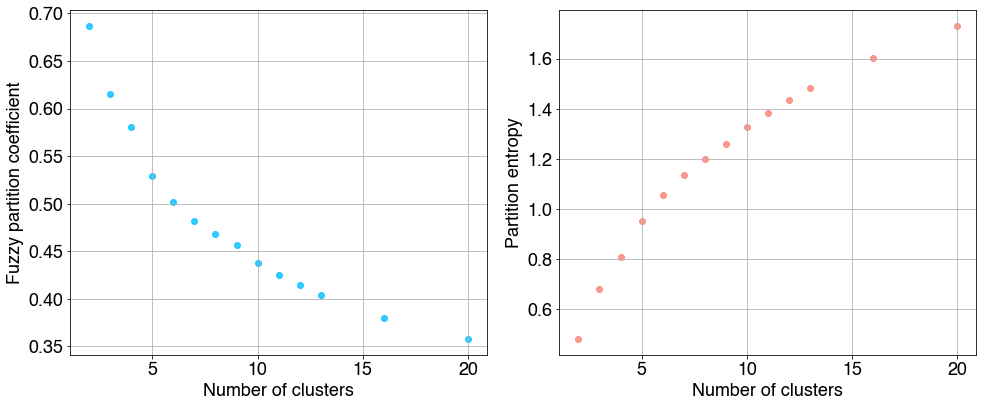

In [56]:
plt.figure(figsize = (14,6))
plt.subplot(121)
plt.scatter(fpc_dict.keys(), fpc_dict.values(), alpha = 0.8, c='deepskyblue')
plt.xlabel('Number of clusters')
plt.ylabel('Fuzzy partition coefficient')
plt.grid()

plt.subplot(122)
plt.scatter(pe_dict.keys(), pe_dict.values(), alpha = 0.8, c='salmon')
plt.xlabel('Number of clusters')
plt.ylabel('Partition entropy')
plt.grid()
plt.tight_layout()
plt.show()

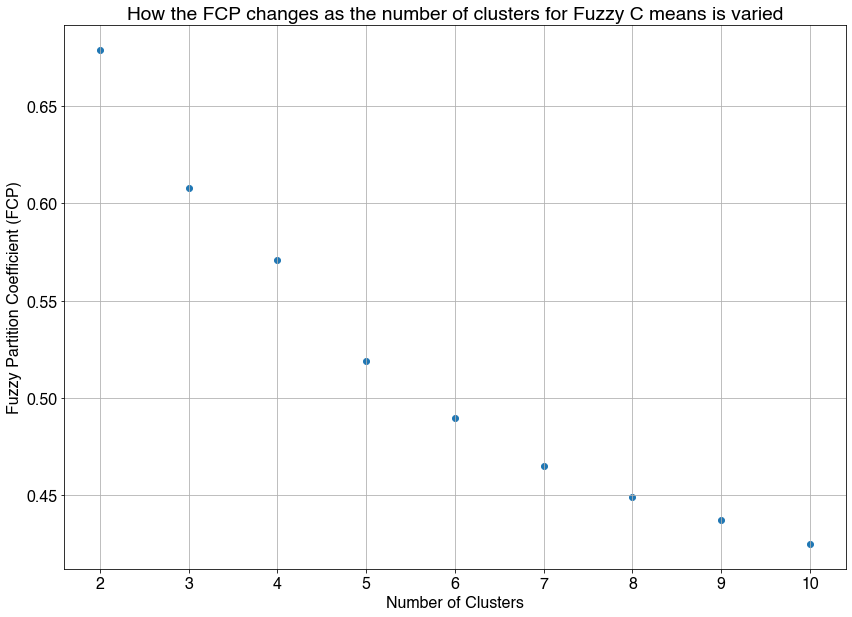

In [40]:
plt.figure(figsize=(14,10))
plt.scatter(fcp_dict.keys(), fcp_dict.values())
plt.title('How the FCP changes as the number of clusters for Fuzzy C means is varied')
plt.xlabel('Number of Clusters')
plt.ylabel('Fuzzy Partition Coefficient (FCP)')
plt.grid()
plt.show()


The likelihood plots for 7 clusters are as follows: 



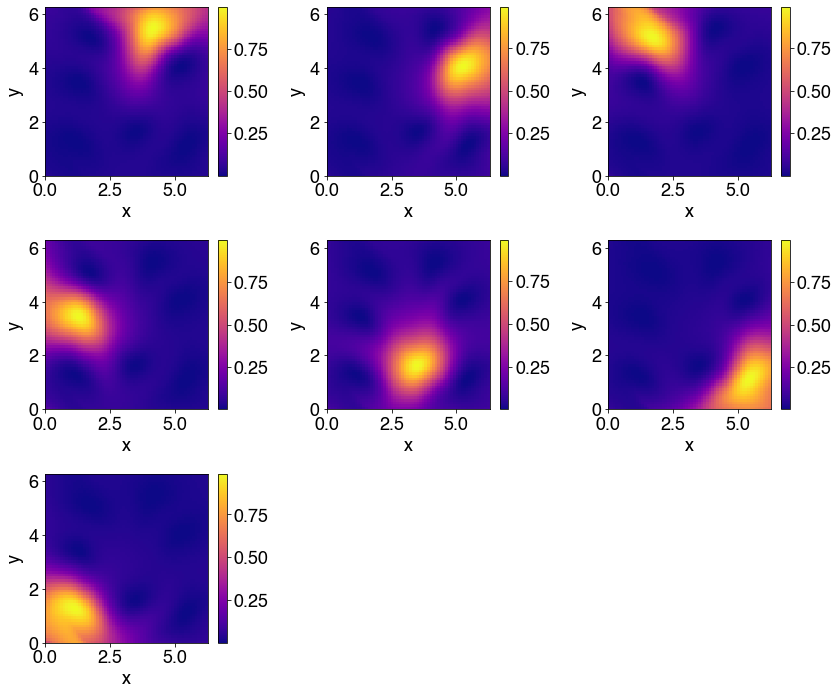

-------------------------------------------------------------------------------------------------



In [68]:
no_clusters = 7

fuzzy_result = fuzz.cluster.cmeans(traj_mat.T,
                              no_clusters,
                              m=2,
                              error=10**(-6),
                              maxiter= 10**3)

u = fuzzy_result[1].T

plot_cluster_likelihoods_alt(x_dat, y_dat, u, (12,10))

---
## Plot trajectories

<IPython.core.display.Javascript object>


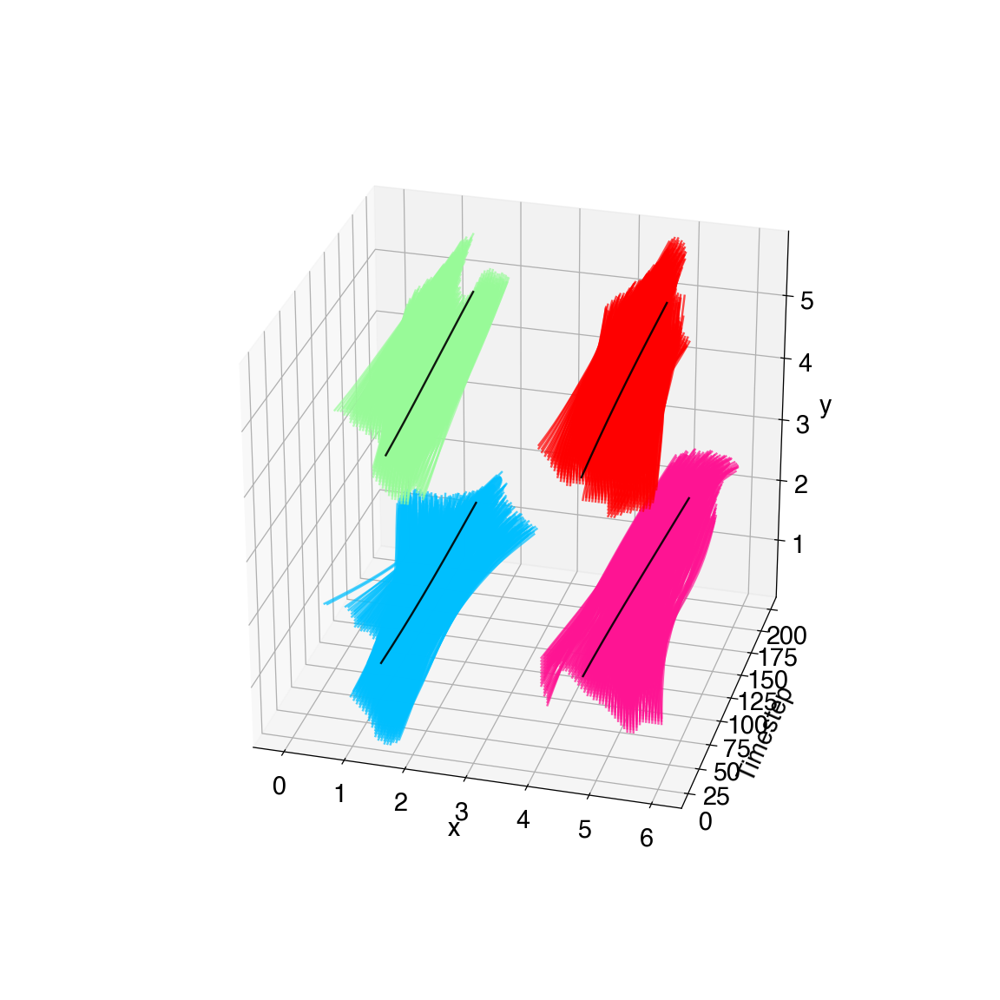

In [57]:
### identify trajectories with membership likelihood greater than some threshold
%matplotlib notebook
%matplotlib notebook
# %matplotlib inline

# get fuzzy matrix - correct shape
u = fuzzy_result[1].T

# set likelihood threshold
u_threshold = 0.9

# make entries below threshold 0
u_cert = np.where(u >= u_threshold, u, 0)

# get trajectories where likelihood non-zero now
# Note: np.where returns 2 array (1st is column position, 2nd row position)
confident_traj = traj_mat[np.where(u_cert != 0)[0],:]

hue_traj = np.where(u_cert != 0)[1]

colour_list = ['r', 'deepskyblue', 'deeppink', 'palegreen', 'mediumpurple', 'salmon',
              'darkorange', 'slategray', 'olivedrab', 'silver', 'r', 'deepskyblue', 'deeppink', 
               'palegreen', 'mediumpurple', 'salmon',
              'darkorange', 'slategray', 'olivedrab', 'silver']

### 3D plotting

# create figure
# fig = plt.figure(figsize = (14,10))
fig = plt.figure(figsize = (10,10))
ax = plt.axes(projection='3d')

# find length of one trajectory
x_traj_length = x_traj_mat[0,:].shape[0]

# clusters 
clusters = fuzzy_result[0]

# number of clusters
no_clusters = clusters.shape[0]

# time steps
t_traj = np.arange(x_traj_length)

# manual hueing
hueing = []

for val in hue_traj:
    hueing.append(colour_list[val])
#     if val == 1:
#         hueing.append('blue')
#     else:
#         hueing.append('red')

# loop through trajectories and plot them
for i in range(confident_traj.shape[0]):
    
    # x trajectory
    x_traj = confident_traj[i,:x_traj_length]
    
    # y trajectory
    y_traj = confident_traj[i,x_traj_length:]
    
    # plot trajectories
    ax.plot3D(x_traj, t_traj, y_traj, c=hueing[i], alpha=0.7)

# loop through clusters and plot them
for i in range(no_clusters):
    
    # x trajectory
    x_traj = clusters[i,:x_traj_length]
    
    # y trajectory
    y_traj = clusters[i,x_traj_length:]
    
    # plot clusters
    ax.plot3D(x_traj, t_traj, y_traj, 'k', alpha=0.9)
    
# graph formatting
ax.set_xlabel('x')
ax.set_ylabel('Timestep')
ax.set_zlabel('y')

plt.show()

---
## Likelihood membership plots

In [ ]:
# membership of trajectory to 1 cluster - as we are only 2 clustering this is complete info
u_single = u[:,0]

# final x and y positions - easier visualisation
x_dat = x_pos[-1].flatten()
y_dat = y_pos[-1].flatten()

# plotting
fig = plt.figure(figsize=(14,10))
ax = plt.axes(projection='3d')
ax.scatter3D(x_dat, y_dat, u_single, c='orange', alpha=0.7)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('Likelihood');

In [ ]:
# membership visualisation
%matplotlib inline

# create bins
bins = np.linspace(0,1,11)

# membership of trajectory to 1 cluster - as we are only 2 clustering this is complete info
u_single = u[:,0]

# bin u values
u_binned = np.digitize(u_single, bins)

# plotting
plt.figure(figsize=(14,8))

sns.scatterplot(x=x_dat,
                y=y_dat,
                hue=u_binned,
                palette='plasma',
                alpha=0.7)

plt.title('Cluster membership of trajectories by final particle position')
plt.xlabel('x')
plt.ylabel('y')
plt.grid()
plt.tight_layout()
plt.show()

---
## Entropy plot

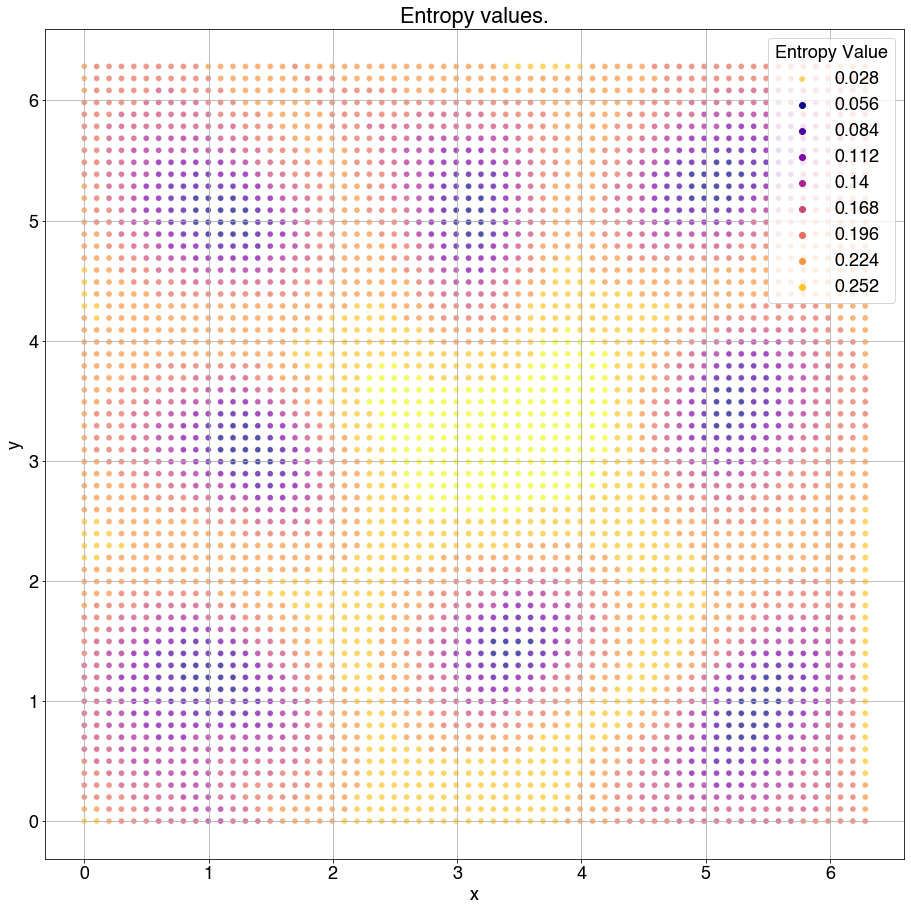

In [66]:
# bigger font
font = {'family' : 'helvetica','size'   : 18}
plt.rc('font', **font) 

# calculate entropy
entropy = np.apply_along_axis(entropy_calc, 1, u)

# create bins
bins = np.linspace(0, max(entropy)+0.01, 10)

# bin u values
entropy_binned = np.digitize(entropy, bins)

# plotting
plt.figure(figsize=(13,13))

# plot data
sns.scatterplot(x=x_dat,
                y=y_dat,
                hue=entropy_binned,
                palette='plasma',
                alpha=0.7,
                legend='full')

plt.title(f'Entropy values.')
plt.legend(np.round(bins[1:],3), title='Entropy Value')
plt.xlabel('x')
plt.ylabel('y')
plt.grid()
plt.tight_layout()

plt.show()

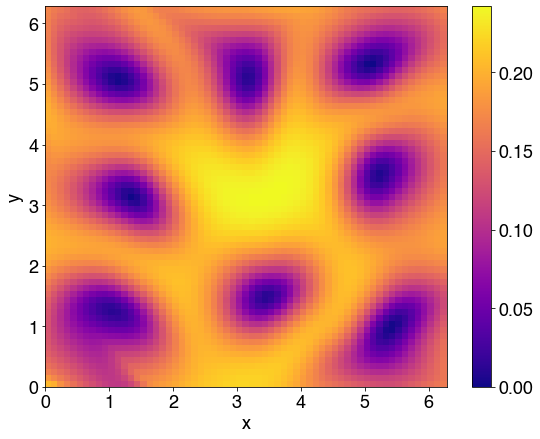

In [67]:
entropy = np.apply_along_axis(entropy_calc, 1, u)

entropy2d = np.reshape(entropy, (Nx,Ny))

x0 = np.linspace(0, 2*np.pi, Nx)
y0 = np.linspace(0, 2*np.pi, Ny)

plt.figure(figsize=(9,7))
plt.pcolormesh(x0,y0, entropy2d, cmap='plasma', shading='auto')
plt.xlabel('x')
plt.ylabel('y')
plt.colorbar()
plt.clim((0,np.max(entropy2d)))
plt.show()

---
## Pendulum flow for example

In [ ]:
# function for random data init 

def rand_trace_pend(M, NX, NY, final_t = 10, no_t_step = 2000):

    # generate initial coords
    x0 = np.random.rand(M)
    x0 = (x0 - 0.5)*NX

    y0 = np.random.rand(M)
    y0 = (y0 - 0.5)*NY

    # time steps
    times, dt = np.linspace(0,final_t, no_t_step, retstep = True)

    # init arrays for point data
    x_pos = []
    y_pos = []

    # maybe add noise to this?

    # now reshape
    x = x0
    y = y0

    # save positions
    x_pos.append(x0)
    y_pos.append(y0)

    # loop through each time step
    for t in times:
        x1 = x + y*dt
        y1 = y - np.sin(x)*dt

        # make sure points wrap around the domain
        #x1 = wrap_domain(x1, -NX/2, NX, centred=True)

        # save positions
        x_pos.append(x1)
        y_pos.append(y1)

        y = np.copy(y1)
        x = np.copy(x1)
        
    return x_pos, y_pos

# number of data points 
# M = 8**2
M = 28**2

# interval length in x and y direction
NX = 16
NY = 6

x_pos, y_pos = rand_trace_pend(M, NX, NY)
    
# plotting
plt.figure(figsize=(14,10))
plt.scatter(x_pos[0], y_pos[0], color='c', 
            label = 'Initial Position', 
            alpha = 0.7)
plt.scatter(x_pos[-1], y_pos[-1], color='r', 
            label = 'Final posiiton',
            alpha = 0.7)
plt.legend()
plt.grid()
plt.show()

In [ ]:
# forming trajectory matrix

# total number of positions in each trajectory
total_ent = x_pos[0].shape[0]

# initialise array to hold all x coordinates
x_traj_mat = np.array([])

# init holder matrix
hold = np.zeros(len(x_pos))

# loop through each position in the trajectory
for j in range(total_ent):
    
    # loop through each step of trajectory
    for i in range(len(x_pos)):
        # put x positions in holder array
        hold[i] = (x_pos[i])[j]
        
    if np.any(x_traj_mat) == False:
        x_traj_mat = np.copy(hold)
    else:
        x_traj_mat = np.vstack((x_traj_mat,hold))
    
y_traj_mat = np.array([])

# loop through each position in the trajectory
for j in range(total_ent):

    # loop through each step of trajectory
    for i in range(len(y_pos)):
        hold[i] = (y_pos[i])[j]
        
    if np.any(y_traj_mat) == False:
        y_traj_mat = np.copy(hold)
    else:
        y_traj_mat = np.vstack((y_traj_mat,hold))
        
### now in form x_{i,t}, ..., x_{i,T}, ..., y_{i,1}, ..., y_{i,T}

# initialise trajectory matrix
traj_mat = np.zeros((x_traj_mat.shape[0], x_traj_mat.shape[1]*2))

# loop through each trajectory
for i in range(x_traj_mat.shape[0]):
    # loop through each position in the trajectory
    for j in range(0, x_traj_mat.shape[1]):
        # store x position
        traj_mat[i,j] = x_traj_mat[i,j]
        # store y position
        traj_mat[i,j+x_traj_mat.shape[1]] = y_traj_mat[i,j]

In [ ]:
# number of clusters
no_clusters_list = [2,3,4,5,6,7,8]

x_dat = x_pos[-1]
y_dat = y_pos[-1]

# graphing original positions
# x_dat = x_pos[0]
# y_dat = y_pos[0]

# loop through number of clusters
for no_clusters in no_clusters_list:
    
    # fuzzy c-means
    fuzzy_result = fuzz.cluster.cmeans(traj_mat.T,
                              no_clusters,
                              m=2,
                              error=10**(-3),
                              maxiter= 10**3)
    
    # print fuzzy coefficient
    print(f'Fuzzy partition coefficient for {no_clusters} centres: {np.round(fuzzy_result[-1],4)}.\n')
    
    # get likelihood matrix
    u = fuzzy_result[1].T

    # calculate entropy
    entropy = np.apply_along_axis(entropy_calc, 1, u)

    # create bins
    bins = np.linspace(0, max(entropy)+0.01, 10)

    # bin u values
    entropy_binned = np.digitize(entropy, bins)

    # plotting
    plt.figure(figsize=(12,5))

    # plot data
    sns.scatterplot(x=x_dat,
                    y=y_dat,
                    hue=entropy_binned,
                    palette='plasma',
                    alpha=0.7)

    plt.title(f'Entropy value of trajectories by final particle position for {no_clusters} clusters.')
    plt.xlabel('x')
    plt.ylabel('y')
    plt.grid()
    plt.tight_layout()

    plt.show()
    
    plot_cluster_likelihoods(x_dat, y_dat, u)
    
    print('--------------------------------------------------------------------------------------------------\n')
          
